# Метод Фурье.

Начальное отклонение конечной струны $f(x)$ задано на отрезке $[0,l]$, а начальная скорость 

$$
   g(x) = \left\{  \begin{matrix} c & , если & x \in [\alpha, \beta] \\ 0 & , если & x \in [0, \alpha) \cap (\beta, l] \end{matrix}  \right.
$$

# Вариант №1

$$f(x)=\sqrt{x(l-x)}, c=1$$
$$l=0.8,  \rho=0.02,  N=0.04,  \alpha=0.38,  \beta=0.42$$

## Задание 1

$f(x, t_0 = 0)$  и  $g(x, t_0 = 0)$

In [5]:
# deps
%pip install numpy matplotlib scipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 39.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.4/22.4 MB 16.4 MB/s eta 0:00:0031m15.7 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 25.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 25.5 MB/s eta 0:00:00

[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


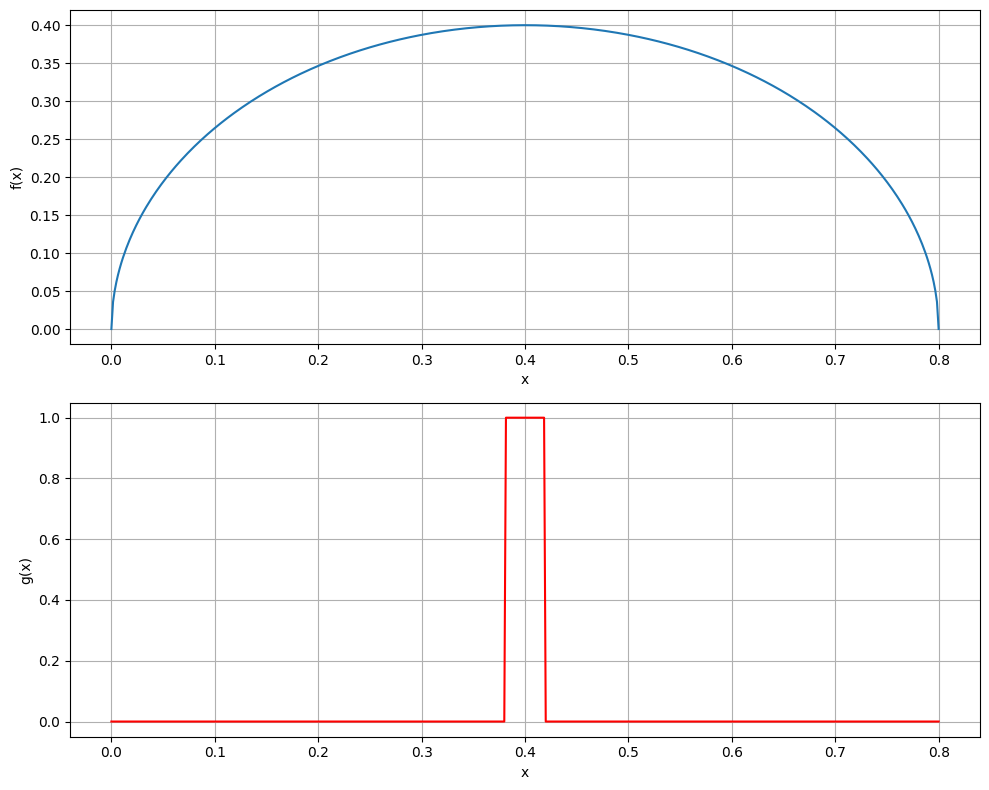

In [6]:
import scipy.integrate as intgrt
import numpy as np
import math as mth
import matplotlib.pyplot as plt


LENGTH = 0.8    # l
STIFFNES = 0.04 # N - жесткость
DENSITY = 0.02  # rho - плотность
ALPHA = 0.38    
BETA = 0.42    

A = mth.sqrt( STIFFNES / DENSITY ) # скорость волны 

c = 1           # начальная скорость


def f(x): 
    return np.sqrt(x* (LENGTH - x))

def g(x):
    return np.where((x >= ALPHA) & (x <= BETA), c, 0)

x = np.linspace(0, LENGTH, 500)

# Вычисляем значения функций
f_values = f(x)
g_values = g(x)

# Создаем фигуру и оси для графиков
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Строим график f(x)
ax1.plot(x, f_values, label='$f(x)$')
ax1.set_xlabel('x')
ax1.set_ylabel('f(x)')
ax1.grid(True)


# Строим график g(x)
ax2.plot(x, g_values, label='$g(x)$', color='red')
ax2.set_xlabel('x')
ax2.set_ylabel('g(x)')
ax2.grid(True)

# Настройка отображения
plt.tight_layout()
plt.show()

## Задание 2 

Найти $A_n$ $\omega_{n}$ при $n=1,2,3,4,5$

Частота гармоник - демонстрирует нам с какой частотой колеблется каждая волна. Как она зависит от каждого показателя: 

l - чем больше длина тем ниже будет частота                                                                 
n - чем больше количество гармоник тем больше буедет частота                                        
a - скокорость с которой будет двигаться струна



$$\omega_{n} = \frac{n \pi}{l} \sqrt{\frac{N}{\rho}}$$

In [7]:
def w_n(num):
    return (mth.pi * num / LENGTH) * mth.sqrt( STIFFNES / DENSITY )

Данный коэфициент демонстрирует как начальное отклонение и то как оно влияет на отображение по отношению к синусоиде 

$$a_{n} = \frac{2}{l} \int_{0}^{l} f(x) \cdot sin\left( \frac{\pi n x}{l} \right) dx $$

In [8]:
def a_n(num):
    return 2/LENGTH * intgrt.quad(lambda x: f(x) * mth.sin( ( mth.pi * num * x ) / LENGTH ) , 0, LENGTH )[0]

Данный коэфициент демонстрирует как начальная скорость влияет на n-ую гармонику

$$b_{n} = \frac{2}{\pi n a} \int_{0}^{l} g(x) \cdot sin\left( \frac{\pi n x}{l} \right) dx$$

In [9]:
def b_n(num):
    return (2 / mth.pi * num * A) * intgrt.quad(lambda x: g(x) * mth.sin( ( mth.pi * num * x ) / LENGTH ), 0, LENGTH, points=[ALPHA, BETA])[0]

формула амплитуды

$$A_n=\sqrt{a_n + b_n}$$

In [10]:
def A_n(num):
    return mth.sqrt(a_n(num) + b_n(num))    # возможно надо все под корнем возвести в квадрат

In [11]:
print(f"{'n':^5} | {'ω_n':^15} | {'a_n':^15} | {'b_n':^15} | {'A_n':^15}")
print("-" * 80)

for n in range(1, 6):
    w = round(w_n(n), 4)
    a = round(a_n(n), 4)
    b = round(b_n(n), 4)
    A = round(A_n(n), 4)
    print(f"{n:^5} | {w:^15} | {a:^15} | {b:^15} | {A:^15}")


  n   |       ω_n       |       a_n       |       b_n       |       A_n      
--------------------------------------------------------------------------------
  1   |     5.5536      |     0.4535      |      0.036      |     0.6996     
  2   |     11.1072     |       0.0       |       0.0       |       0.0      
  3   |     16.6608     |     0.0751      |      -0.0       |     0.2741     
  4   |     22.2144     |       0.0       |      -0.0       |       0.0      
  5   |     27.768      |     0.0338      |       0.0       |     0.1839     


## Задание 3

In [12]:
import matplotlib.animation as animation
from IPython.display import HTML
 
x = np.linspace(0, LENGTH, 500)
t = np.linspace(0, 2 * np.pi / w_n(1), 100)  

# Создаем анимацию для каждой гармоники
fig, axs = plt.subplots(2, 3, figsize=(18, 8))
fig.suptitle('Движение струны для разных гармоник', fontsize=16)

# Удаляем пустой subplot
fig.delaxes(axs[1, 2])

# Определяем функции для анимации
def init():
    for n in range(1, 6):
        row = (n-1) // 3
        col = (n-1) % 3
        if n <= 5:
            axs[row, col].set_title(f'Гармоника {n}')
            axs[row, col].set_xlabel('x')
            axs[row, col].set_ylabel('u(x, t)')
            axs[row, col].set_xlim(0, LENGTH)
            axs[row, col].set_ylim(-1.5 * A_n(n), 1.5 * A_n(n))
    return []

def animate(i):
    frames = []
    for n in range(1, 6):
        row = (n-1) // 3
        col = (n-1) % 3
        if n <= 5:
            # Очищаем ось перед рисованием нового кадра
            axs[row, col].clear()
            axs[row, col].set_title(f'Гармоника {n}')
            axs[row, col].set_xlabel('x')
            axs[row, col].set_ylabel('u(x, t)')
            axs[row, col].set_xlim(0, LENGTH)
            axs[row, col].set_ylim(-1.5 * A_n(n), 1.5 * A_n(n))
            
            # Вычисляем текущее положение струны для гармоники n
            u = A_n(n) * np.sin(w_n(n) * t[i]) * np.sin((np.pi * n * x) / LENGTH)
            line, = axs[row, col].plot(x, u, 'b')
            frames.append(line)
    return frames

ani = animation.FuncAnimation(fig, animate, frames=len(t), init_func=init, blit=True, interval=50)

plt.close() 
HTML(ani.to_jshtml())